<div><center><img src="https://ml.ucv.ai/logo.png\" width=150"/> </center></div>

# 10 Procesamiento de imágenes con CNN

## Versión v.2

El notebook lo puedo modificar, esta versión es la v.1 a 19/08/2024 a las 2pm de Caracas.

- Agregado ejemplo de FNN con MNIST. Fácilmente modificable con CNN.

Basado en:
- Operaciones: https://docs.opencv.org/3.4/d5/d98/tutorial_mat_operations.html
- Blending: https://docs.opencv.org/3.4/d5/dc4/tutorial_adding_images.html
- https://cs231n.github.io/convolutional-networks/
- “Understanding Convolution in Deep Learning” Dettmers, Tim. TD Blog, 26 Mar 2015.
- “Convolutional Neural Networks for Visual Recognition” Li, Fei-Fei et al. Stanford University Courses, Spring 2017.
- https://developer.nvidia.com/discover/convolutional-neural-network

## Aprendizaje Automático [UCV]

* Autor: Fernando Crema García
* Contacto: fernando.cremagarcia@kuleuven.be; fernando.cremagarcia@esat.kuleuven.be

---

# Imágenes

- Una imagen es representada como una matriz bidimensional de píxeles en el caso de imágenes en escala de grises
- Como un conjunto de tres matrices bidimensionales correspondientes a los canales de color rojo, verde y azul (RGB) para imágenes a color.
- Como un conjunto de cuatro matrices bidimensionales correspondientes a los canales de color rojo, verde y azul (RGB) para el color y una matriz extra del canal alpha.

# Procesamiento de imágenes

## Operadores

Un operador en una imagen es una función que toma como entrada 1 o más imagénes y produce como resultado una imagen.

Un operador puede ser:
- Operadores de puntos (transformaciones de píxeles)
- Operadores de vecindades (basado en área)

## Operadores de punto

- La función de entrada debe depender solamente del píxel actual y de parámetros globales para toda la función.
- Ejemplos de estos operadores:
  1. Brillo
  1. Contraste
  1. Corrección de color
  1. Transformaciones



In [ ]:
def comparar_img(img1, img2, t1, t2):
  # Display the original and adjusted images
  fig, ax = plt.subplots(1, 2, figsize=(10, 5))
  ax[0].imshow(img1, cmap='gray')
  ax[0].set_title(t1)
  ax[0].axis('off')

  ax[1].imshow(img2, cmap='gray')
  ax[1].set_title(t2)
  ax[1].axis('off')

  plt.show()

In [ ]:
def ver_img(img1, t1):
  # Display the original and adjusted images
  fig, ax = plt.subplots(1, 1, figsize=(10, 5))
  ax[0].imshow(img1, cmap='gray')
  ax[0].set_title(t1)
  ax[0].axis('off')

  plt.show()

### Brillo y contraste

Una definición básica de una función puede ser como: $$S(i, j)=\alpha \cdot P(i, j)+\beta$$

Dónde:
1. $P$ es el píxel $(i, j)$ de la imagen.
1. $S$ es el píxel $(i, j)$ de la imagen de salida.
1. $\alpha$ podría ser considerado como ganancia.
1. $\beta$ podría ser considerado como sesgo

En general, la ganancia incrementa el contraste y el sesgo el brillo.

#### Ejemplo 1: OpenCV

In [ ]:
import cv2 as cv
import numpy as np
from google.colab.patches import cv2_imshow

In [ ]:
image = cv.imread("family.jpg")

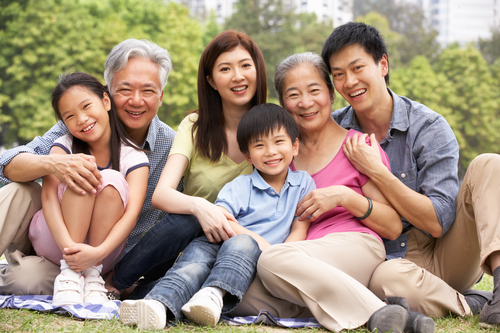

In [ ]:
cv2_imshow(image)

In [ ]:
alpha = 1 # Valores usuales de 1 a 3
beta = 0

In [ ]:
image.shape

(333, 500, 3)

In [ ]:
height, length, channels = image.shape

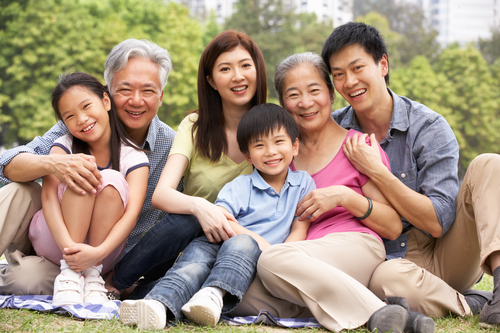

In [ ]:
cv2_imshow(image)

In [ ]:
S = np.zeros(image.shape, image.dtype)
for h in range(height):
  for l in range(length):
    for c in range(channels):
      S[h, l, c] = np.clip(alpha * image[h, l,c] + beta, 0, 255)

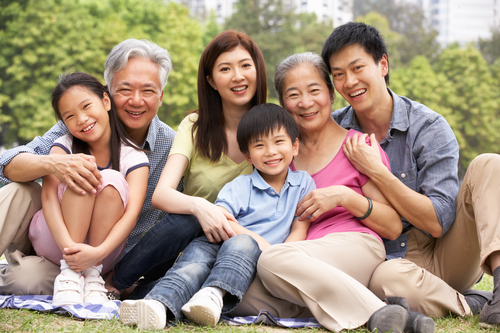

In [ ]:
cv2_imshow(S)

In [ ]:
S_cv = cv.convertScaleAbs(image, alpha=alpha, beta=beta)

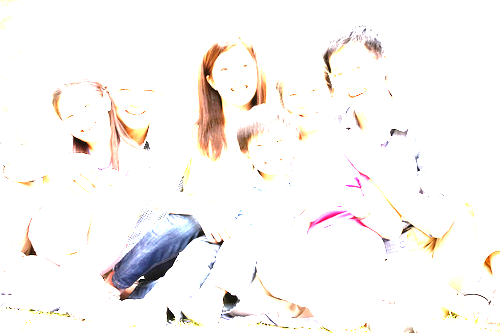

In [ ]:
cv2_imshow(S_cv)

#### Cómo podemos verificar que son iguales

array([[[121, 139, 123],
        [133, 131, 115],
        [133, 129, 113],
        ...,
        [207, 197, 201],
        [211, 201, 205],
        [219, 205, 211]],

       [[112, 167, 147],
        [112, 159, 141],
        [124, 143, 123],
        ...,
        [209, 197, 207],
        [213, 203, 207],
        [219, 209, 213]],

       [[105, 185, 163],
        [106, 169, 147],
        [115, 155, 133],
        ...,
        [207, 201, 205],
        [217, 207, 211],
        [221, 211, 215]],

       ...,

       [[209,  55,  61],
        [233,  73,  77],
        [231,  57,  75],
        ...,
        [157, 127, 149],
        [121, 215, 209],
        [157, 187, 171]],

       [[199,  51,  53],
        [159,  15,  17],
        [127, 249,   1],
        ...,
        [127, 195, 195],
        [193, 121, 125],
        [139,   7, 235]],

       [[247, 111,  99],
        [167,  51,  37],
        [157,  39,  19],
        ...,
        [123,   1, 243],
        [131,   3, 247],
        [187,  41,  55]]], dtype=uint8)
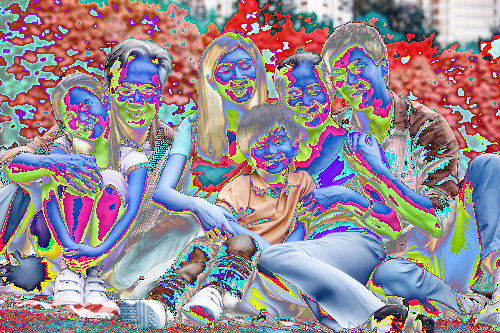

In [ ]:
image - (S_cv - S)

#### Ejemplo 3: Una imagen "mala"

Imagen de Visem  [CC BY-SA 3.0], via Wikimedia Commons

In [ ]:
bad_image = cv.imread("bad_image.png")

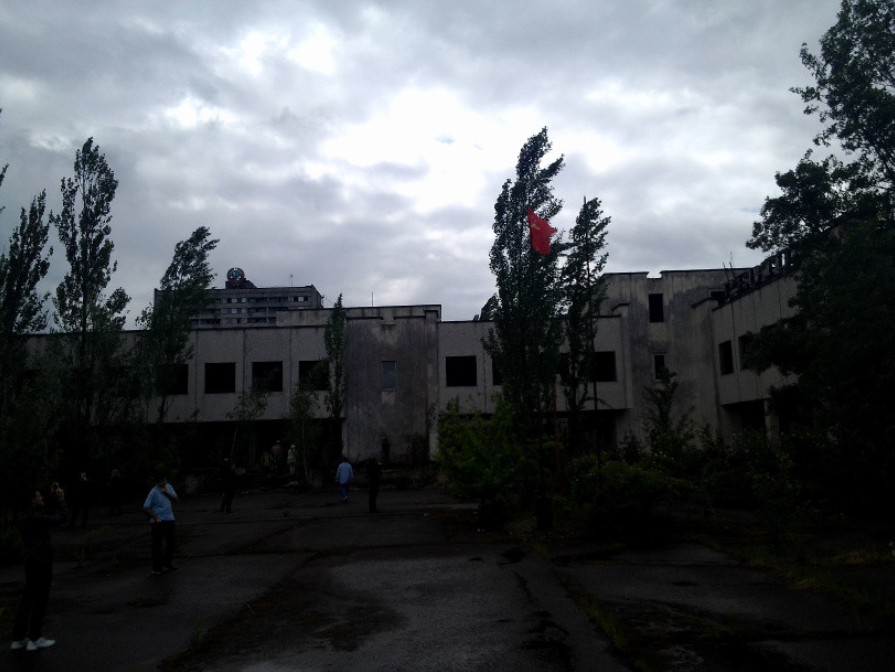

In [ ]:
cv2_imshow(bad_image)

#### Viendo el histograma de la imagen

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from skimage import io

def plot_histogram(image):
  # Calcular el histograma para cada canal de color
  colors = ('r', 'g', 'b')
  for i, color in enumerate(colors):
      histogram, bin_edges = np.histogram(
          image[:, :, i], bins=256, range=(0, 256))

      # Trazar el histograma
      plt.plot(bin_edges[0:-1], histogram, color=color)

  plt.title("Histograma de la Imagen a Color")
  plt.xlabel("Valor del Píxel")
  plt.ylabel("Frecuencia")
  plt.xlim([0, 256])
  plt.show()

def plot_histogram_gris(image_gray):
  # Calcular el histograma
  histogram, bin_edges = np.histogram(image_gray, bins=256, range=(0, 1))

  # Trazar el histograma
  plt.figure()
  plt.title("Histograma de la Imagen en Escala de Grises")
  plt.xlabel("Valor del Píxel")
  plt.ylabel("Frecuencia")
  plt.xlim([0.0, 1.0])  # <- considerando que la imagen está normalizada entre 0 y 1
  plt.plot(bin_edges[0:-1], histogram)  # <- trazar histograma
  plt.show()

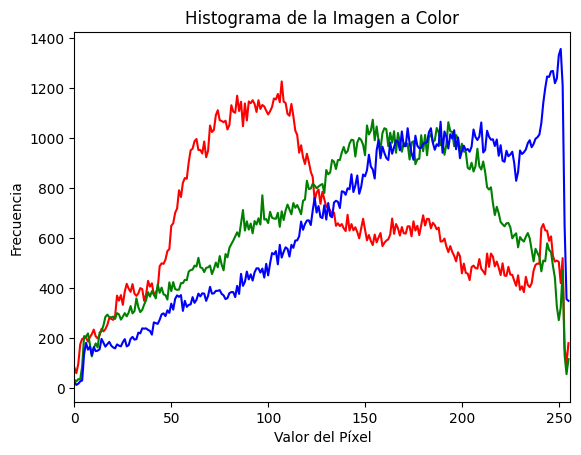

In [ ]:
plot_histogram(image=bad_image.copy())

Lo natural es intentar modificar el histograma porque la mayoría de píxeles están a la derecha

In [ ]:
alpha = 1.3
beta = 40

In [ ]:
S_mala = cv.convertScaleAbs(bad_image, alpha=alpha, beta=beta)

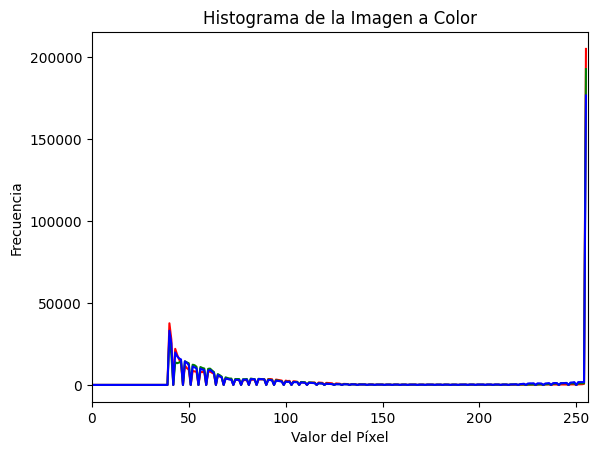

In [ ]:
plot_histogram(S_mala)

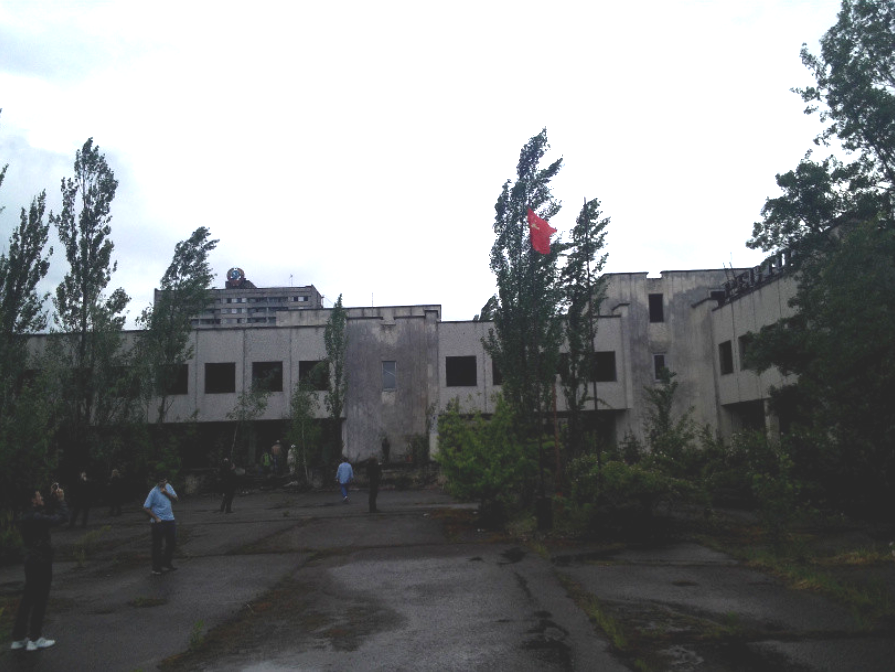

In [ ]:
cv2_imshow(S_mala)

#### Ejemplo 2: skimage

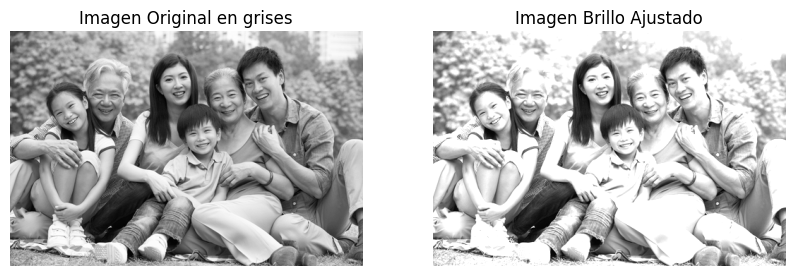

In [ ]:
import numpy as np
from skimage import io
from skimage import exposure
from skimage import color
import matplotlib.pyplot as plt

# Cargar la imagen
image = io.imread('family.jpg')

# Convertir a escala de grises
image_gray = color.rgb2gray(image)

# Ajustar brillo y contraste con skimage
ganancia = 1
sesgo = 0.3
brightness_adjusted = np.clip(ganancia*image_gray + sesgo, 0, 1)

# Ver imágenes
comparar_img(image_gray, brightness_adjusted, "Imagen Original en grises", "Imagen Brillo Ajustado")


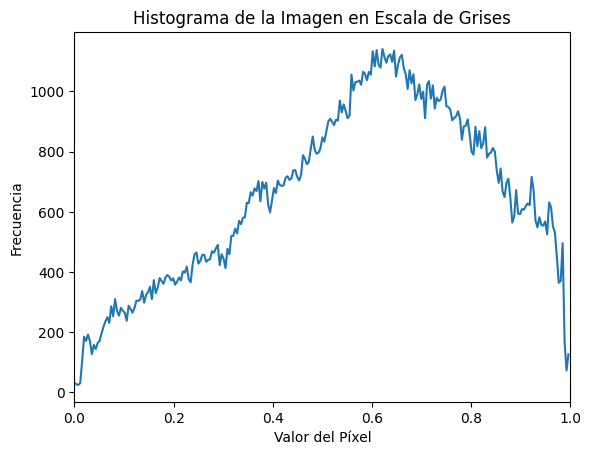

In [ ]:
plot_histogram_gris(image_gray=image_gray.copy())

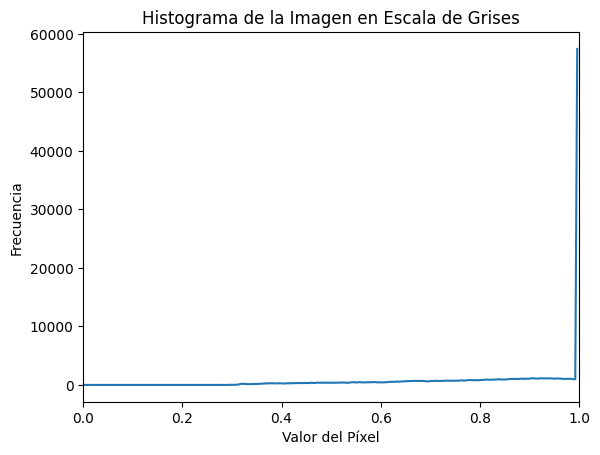

In [ ]:
plot_histogram_gris(image_gray=brightness_adjusted.copy())

### Corrección gamma

Otro método para corregir brillo usando una transformación no lineal de los píxeles dependiendo de un valor global gamma ($\gamma$)

En este caso tenemos: $$S(i, j)=\left(\frac{P(i, j)}{255}\right)^\gamma \times 255$$

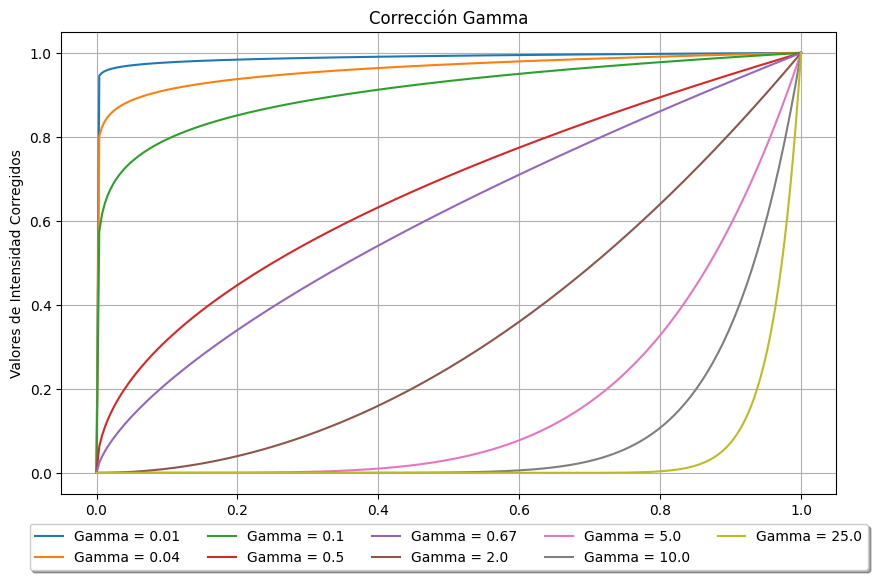

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# Crear una matriz de valores de intensidad de píxeles de 0 a 1
intensity_values = np.linspace(0, 1, 256)

# Valores preseleccionados de gamma
gamma_values = [0.01, 0.04, 0.1, 0.5, 0.67, 2.0, 5.0, 10.0, 25.0]

# Graficar la corrección gamma para cada valor preseleccionado
plt.figure(figsize=(10, 6))

for gamma in gamma_values:
    corrected_values = np.power(intensity_values, gamma)
    plt.plot(intensity_values, corrected_values, label=f'Gamma = {gamma}')

plt.title('Corrección Gamma')
plt.xlabel('Valores de Intensidad Originales')
plt.ylabel('Valores de Intensidad Corregidos')
# Put a legend below current axis
plt.legend(loc='upper center', bbox_to_anchor=(0.5, -0.05),
          fancybox=True, shadow=True, ncol=5)
plt.grid(True)
plt.show()


Es fácil entender que:

Cuando $\gamma<1$, los valores oscuros tendrán más brillo y el histograma se desplazará hacia la derecha mientras que ocurrirá el efecto contrario para valores donde $\gamma>1$

In [ ]:
gamma = 0.4
lookUpTable = np.empty((1,256), np.uint8)
for i in range(256):
    lookUpTable[0,i] = np.clip(pow(i / 255.0, gamma) * 255.0, 0, 255)


In [ ]:
S_gamma = cv.LUT(bad_image, lookUpTable)

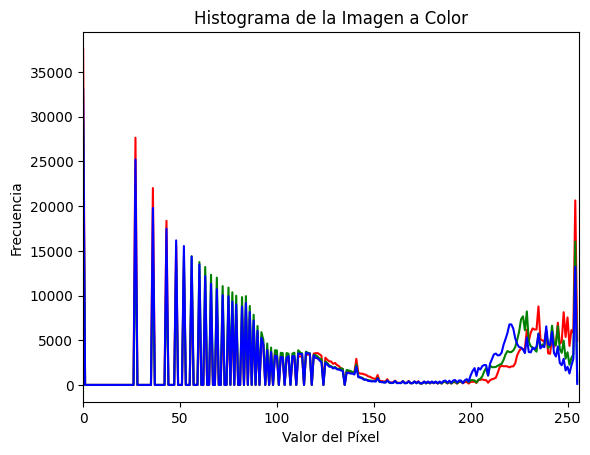

In [ ]:
plot_histogram(image=S_gamma)

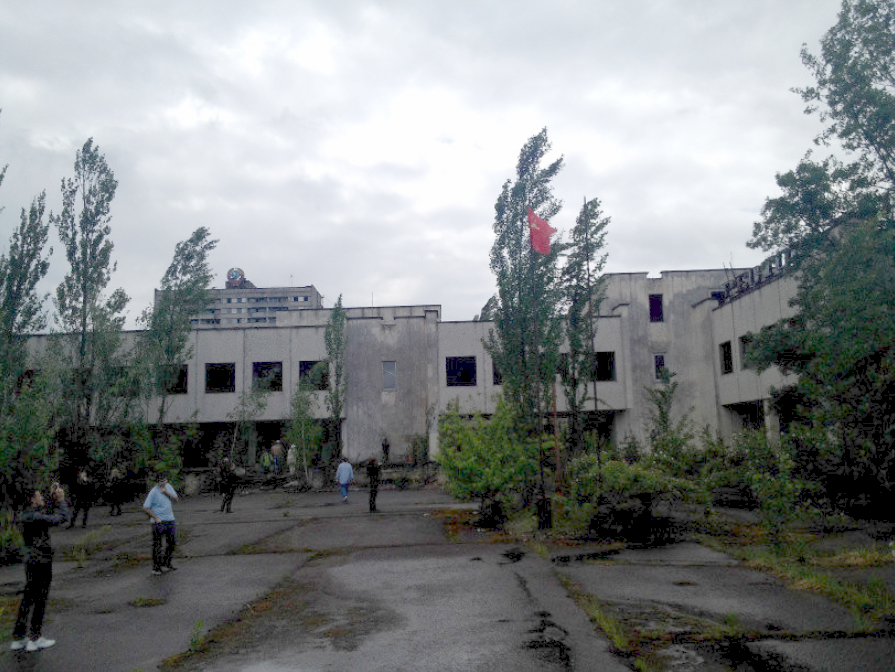

In [ ]:
cv2_imshow(S_gamma)

### Marca de agua: Image blending

En la definición de operadores de punto establecimos claramente que la entrada pueden ser dos imágenes.

Si quisiéramos agregar una marca de agua a una imagen pudiésemos usar el operador linear de mezcla (linear blending operator)

Es bastante intuitiva la definición: $$
S(i, j)=(1-\alpha) P_0(i, j)+\alpha P_1(i, j)
$$

Es la combinación convexa de dos imagenes ponderadas por un valor alfa ($\alpha$)

In [ ]:
me = cv.imread('crema.png')
roma = cv.imread('asroma.jpg')

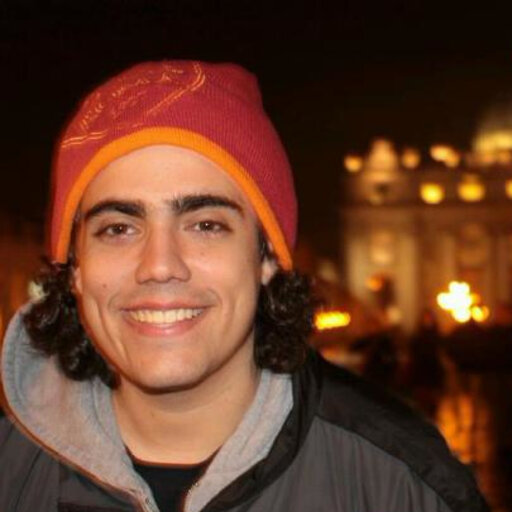

In [ ]:
cv2_imshow(me)

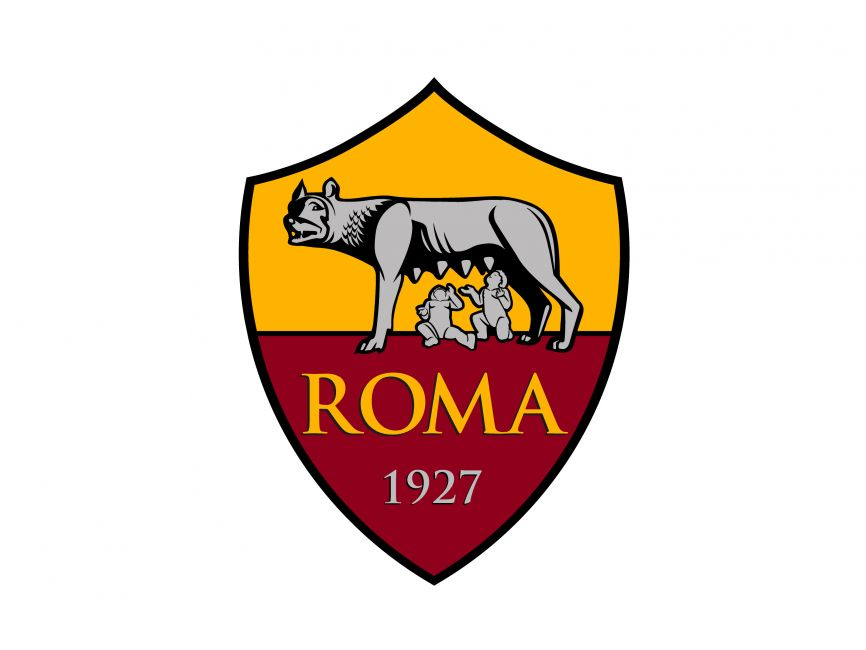

In [ ]:
cv2_imshow(roma)

In [ ]:
me.shape

(512, 512, 3)

In [ ]:
roma.shape

(650, 866, 3)

In [ ]:
alpha = 0.7
beta = (1.0 - alpha)
dst = cv.addWeighted(me, alpha, roma, beta, 0.0)

error: OpenCV(4.10.0) /io/opencv/modules/core/src/arithm.cpp:658: error: (-209:Sizes of input arguments do not match) The operation is neither 'array op array' (where arrays have the same size and the same number of channels), nor 'array op scalar', nor 'scalar op array' in function 'arithm_op'


#### Qué va a pasar?

In [ ]:
roma.shape

(650, 866, 3)

In [ ]:
me.shape

(512, 512, 3)

In [ ]:
# Especificar las coordenadas de inicio (x, y), el ancho (w) y la altura (h)
size = 512
x, y, w, h = 0, 0, 0+size, 0+size # Ejemplo de valores

# Recortar la imagen
cropped_roma = roma[y:y+h, x:x+w]

In [ ]:
cropped_roma.shape

(512, 512, 3)

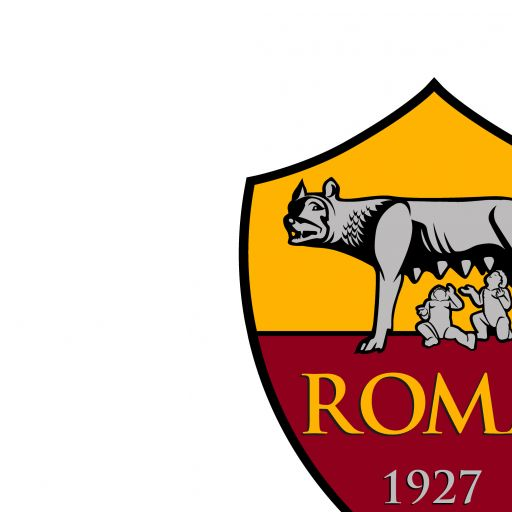

In [ ]:
cv2_imshow(cropped_roma)

In [ ]:
alpha = 0.7
beta = (1.0 - alpha)
dst = cv.addWeighted(me, alpha, cropped_roma, beta, 0.0)

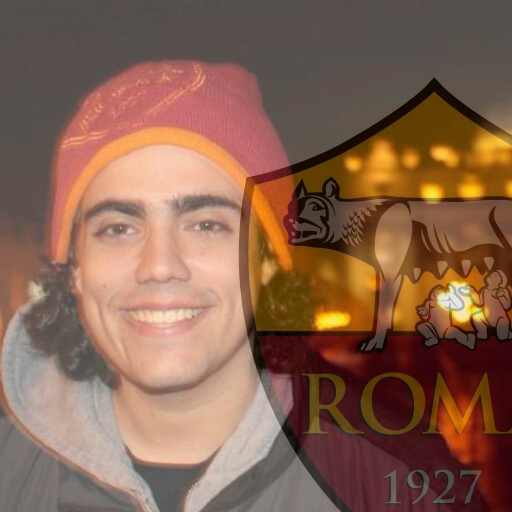

In [ ]:
cv2_imshow(dst)

Ideas:

1. Crop el logo en la zona interesante
1. Reducir o aumentar dimensión
1. Usar padding para colocarlo en la imagen original

## Operadores de vecindad

### Convolución

Convolución es el proceso de transformar cada elemento de una imagen usando un kernel (filtro) de dimensión reducida tomando en cuenta los vecinos del píxel de interés.

La definición general de la operación de convolución para una submatrix de $X$ de dimensión $n \times m$ contra el kernel $K$ de dimensión $m \times n$ es:

$$
K_{n,m} * X_{n, m} = \left[\begin{array}{cccc}
k_{11} & k_{12} & \cdots & k_{1 n} \\
k_{21} & k_{22} & \cdots & k_{2 n} \\
\vdots & \vdots & \ddots & \vdots \\
k_{m 1} & k_{m 2} & \cdots & k_{m n}
\end{array}\right] * \left[\begin{array}{cccc}
x_{11} & x_{12} & \cdots & x_{1 n} \\
x_{21} & x_{22} & \cdots & x_{2 n} \\
\vdots & \vdots & \ddots & \vdots \\
x_{m 1} & x_{m 2} & \cdots & x_{m n}
\end{array}\right]=\sum_{i=0}^{m-1} \sum_{j=0}^{n-1} k_{(1+i)(1+j)} x_{(m-i)(n-j)}
$$

En general, los kernel serán más pequeños que la imagen original. Supongamos que tenemos el kernel

$$
K = \left[\begin{array}{lll}
a & b & c \\
d & e & f \\
g & h & i
\end{array}\right]
$$

y la imagen 5x5
$$
\left[\begin{array}{lll}
1 & 2 & 3 & 4 & 5\\
6 & 7 & 8 & 9 & 10 \\
11 & 12 & 13 & 14 & 15 \\
16 & 17 & 18 & 19 & 20 \\
21 & 22 & 23 & 24 & 25
\end{array}\right]
$$

Aplicar la convolución en el píxel $(2, 2)$ usando el Kernel $K$ viene reflejado como:

$$
\left(\left[\begin{array}{lll}
a & b & c \\
d & e & f \\
g & h & i
\end{array}\right] *\left[\begin{array}{lll}
1 & 2 & 3 \\
6 & 7 & 8 \\
11 & 12 & 13
\end{array}\right]\right)[2,2]=(i \cdot 1)+(h \cdot 2)+(g \cdot 3)+(f \cdot 6) +(e \cdot 7)+(d \cdot 8)+(c \cdot 11)+(b \cdot 12)+(a \cdot 13)
$$

Es decir, es la operación punto a punto luego de hacer flip de filas y columnas del kernel y sumar todas sus entradas.

$$
\left(\left[\begin{array}{lll}
i & h & g \\
f & e & d \\
c & b & a
\end{array}\right] *\left[\begin{array}{lll}
1 & 2 & 3 \\
6 & 7 & 8 \\
11 & 12 & 13
\end{array}\right]\right)[2,2]=(i \cdot 1)+(h \cdot 2)+(g \cdot 3)+(f \cdot 6) +(e \cdot 7)+(d \cdot 8)+(c \cdot 11)+(b \cdot 12)+(a \cdot 13)
$$


In [ ]:
import numpy as np
from scipy.signal import convolve2d

# Define a 5x5 "image"
image = np.array([
    [1, 2, 3, 4, 5],
    [6, 7, 8, 9, 10],
    [11, 12, 13, 14, 15],
    [16, 17, 18, 19, 20],
    [21, 22, 23, 24, 25]
])

# Define a 3x3 blur kernel
kernel = np.array([
    [1, 1, 1],
    [1, 2, 1],
    [1, 1, 1]
])

# Perform the 2D convolution
convolved_image = convolve2d(image, kernel, mode='same')

print(convolved_image)

[[ 17  29  36  43  33]
 [ 45  70  80  90  67]
 [ 80 120 130 140 102]
 [115 170 180 190 137]
 [ 97 139 146 153 113]]


In [ ]:
np.sum([1, 2, 3, 6, 7, 8, 11, 12, 13])

63

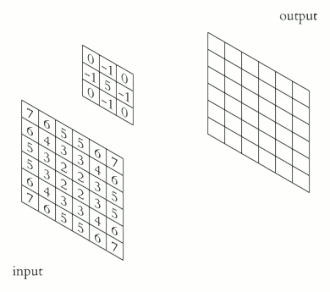

### Operadores útiles (ejemplos)

#### Operador Sobel

Detección de bordes

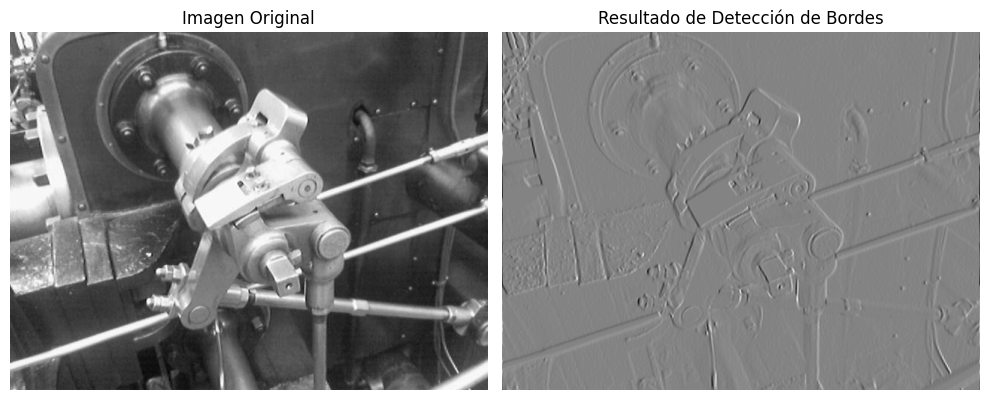

In [ ]:
import numpy as np
from scipy.signal import convolve2d
from PIL import Image
import matplotlib.pyplot as plt

# Paso 1: Cargar la imagen y convertirla a escala de grises
image_path = 'motors.png'  # Actualiza esto a la ruta de tu imagen
image = Image.open(image_path).convert('L')  # Convertir a escala de grises usando PIL
image_array = np.array(image)

# Paso 2: Definir un kernel para la detección de bordes (operador Sobel)
kernel = np.array([
    [-1, 0, 1],
    [-2, 0, 2],
    [-1, 0, 1]
])

kernel = np.array([
    [a, b, c],
    [d, e, f],
    [g, h, i]
])

# Paso 3: Aplicar la operación de convolución
convolved_image = convolve2d(image_array, kernel, mode='same', boundary='wrap')

# Paso 4: Mostrar las imágenes original y procesada
fig, ax = plt.subplots(1, 2, figsize=(10, 5))
ax[0].imshow(image_array, cmap='gray')
ax[0].set_title('Imagen Original')
ax[0].axis('off')

ax[1].imshow(convolved_image, cmap='gray')
ax[1].set_title('Resultado de Detección de Bordes')
ax[1].axis('off')

plt.tight_layout()
plt.show()


In [ ]:
import numpy as np
from scipy.signal import convolve2d
from PIL import Image
import matplotlib.pyplot as plt

# Paso 1: Cargar la imagen y convertirla a escala de grises
image_path = 'motors.png'  # Actualiza esto a la ruta de tu imagen
image = Image.open(image_path).convert('L')  # Convertir a escala de grises usando PIL
image_array = np.array(image)

# Paso 2: Escala de grises
kernel = np.array([
    [0, -1, 0],
    [-1, 5, -1],
    [0, -1, 0]
])

# Paso 3: Aplicar la operación de convolución
convolved_image = convolve2d(image_array, kernel, mode='same', boundary='wrap')

# Paso 4: Mostrar las imágenes original y procesada
fig, ax = plt.subplots(1, 2, figsize=(10, 5))
ax[0].imshow(image_array, cmap='gray')
ax[0].set_title('Imagen Original')
ax[0].axis('off')

ax[1].imshow(convolved_image, cmap='gray')
ax[1].set_title('Resultado de Escala de grises')
ax[1].axis('off')

plt.tight_layout()
plt.show()


FileNotFoundError: [Errno 2] No such file or directory: 'motors.png'

#### Blur



In [ ]:
motors = cv.imread('motors.png')
kernel2 = np.ones((5, 5), np.float32) / 25
blurred = cv.filter2D(src=motors, ddepth=-1, kernel=kernel2)

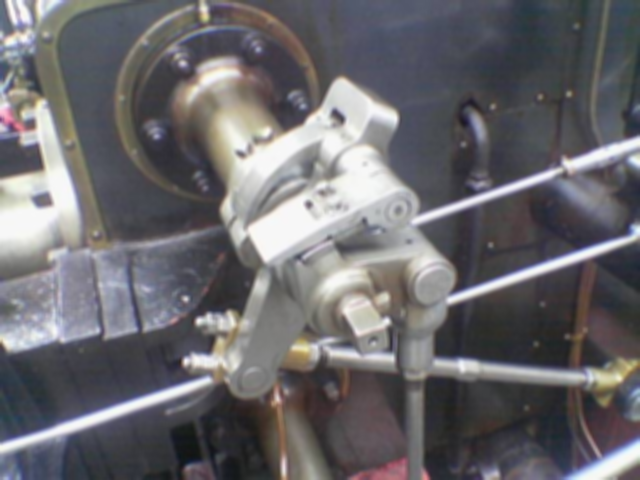

In [ ]:
cv2_imshow(blurred)

Sin embargo, la mayoría de operadores están definidos ya en los frameworks

In [ ]:
blurred_2 = cv.blur(src=motors, ksize=(5,5))

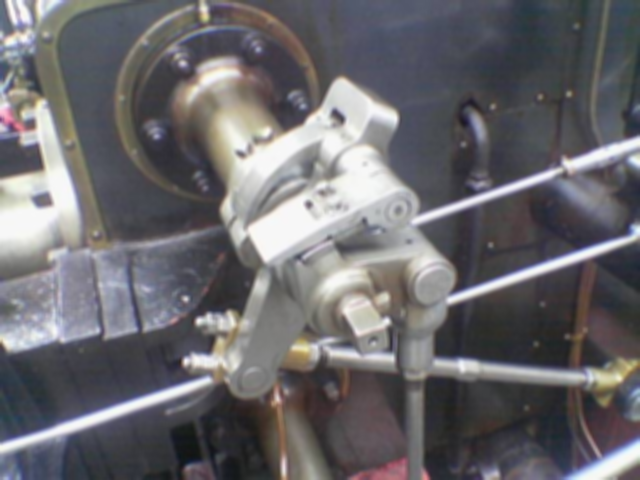

In [ ]:
cv2_imshow(blurred_2)

#### Otros operadores (Kernels)

https://en.wikipedia.org/wiki/Kernel_(image_processing)

# Redes Neuronales Convolucionales

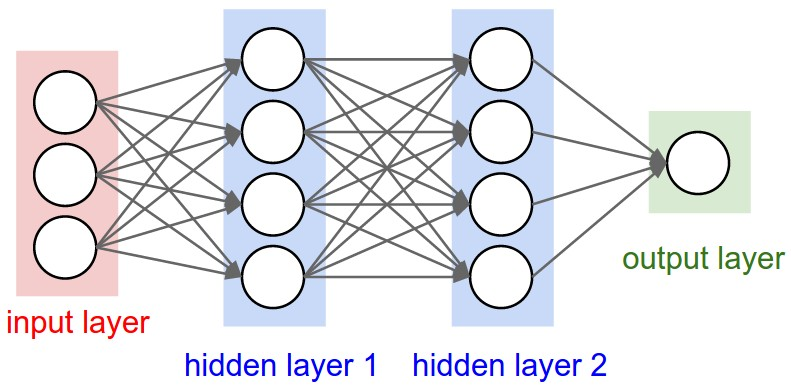

- Las redes convencionales reciben como entrada un vector y aplican transformaciones por cada capa oculta
- En la última capa normalmente llamada capa de salida decidimos el tipo de aprendizaje: regresión o clasificación
- Las redes neuronales convencionales no escalan bien para imágenes de alta resolución: una imagen 32 x 32 x 3 = 3072 pesos por entrenar. Pero si la imagen es 500x500 ahora tendríamos 750.000

### Definición

Una red convolucional igualmente está compuesta por capas. Cada capa tendrá distinta funcionalidad pero tienen un objetivo en común: transformar un volumen 3D de entrada en un volumen 3D de salida con alguna función diferenciable que puede tener o no parámetros.

- Las neuronas en cada capa están ordenadas en tres dimensiones: ancho, alto y profundidad.
- Las capas intermedias pueden ser:
  1. Capas convolucionales
  1. Capas de pooling
  1. Capas de normalización
  1. Capas completamente conectadas (Estas las conocemos) (Linear)

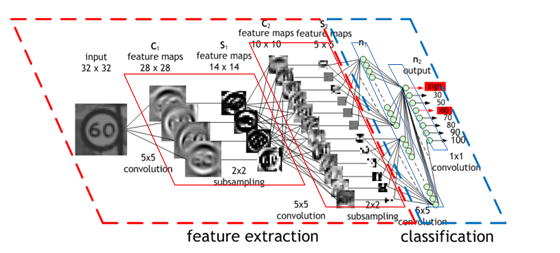

### Capas de convolución

Aplicando el concepto de convolución, buscamos entrenar filtros dependiendo del los parámetros que queramos usar.

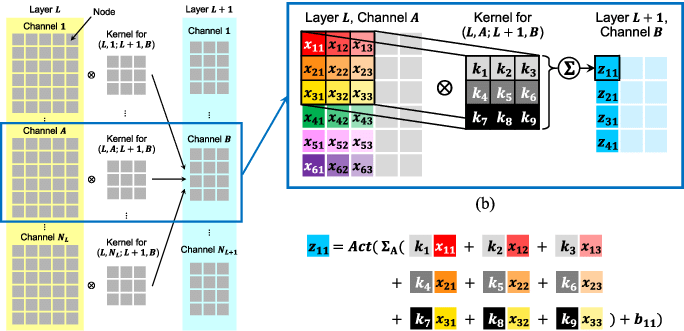

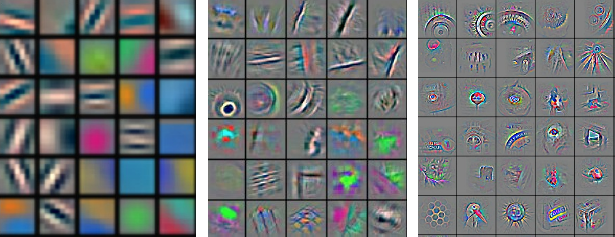

### Capas de Pooling

Es común insertar periódicamente una capa de Pooling entre capas Conv sucesivas en una arquitectura ConvNet.

- Su función es reducir progresivamente el tamaño del espacio de representación para reducir la cantidad de parámetros y cálculos en la red y, por tanto, también controlar el sobreajuste.

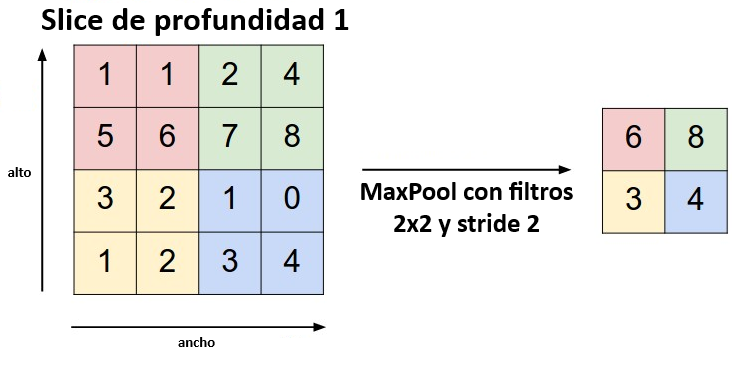

Ejemplo:

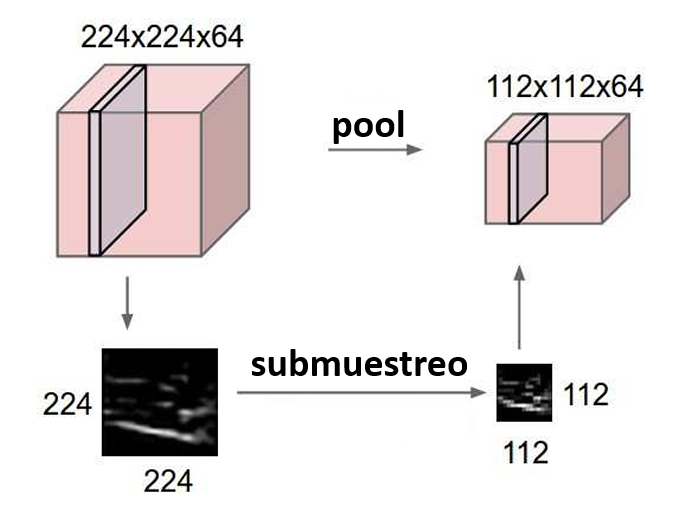

Lo que sucede entonces es que las capas convolucionales son reducidas en las de pooling.

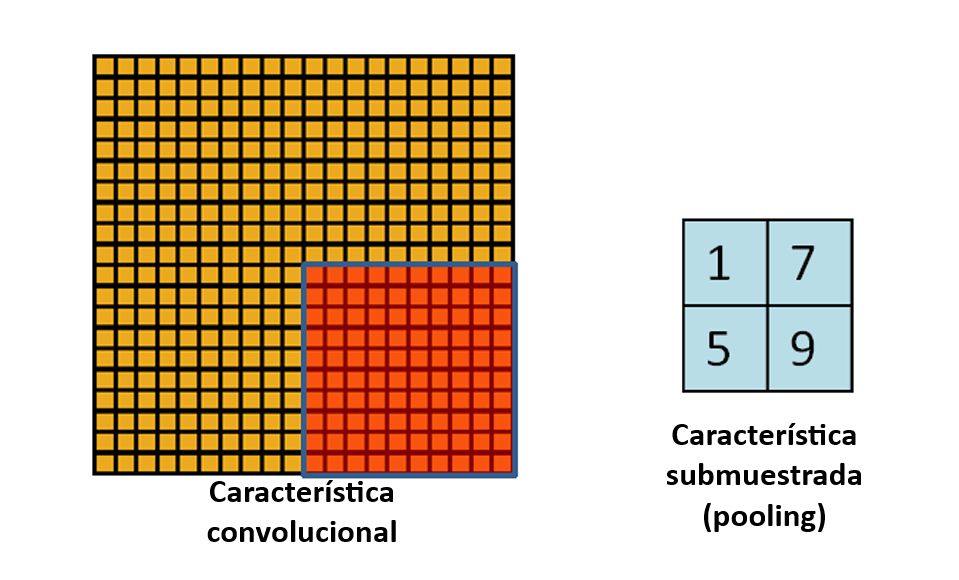

In [ ]:
from IPython.display import IFrame
IFrame('https://cs231n.github.io/assets/conv-demo/index.html', width=700, height=700)

### Capas de Normalización: [Normalization Layer](https://arxiv.org/abs/1607.06450)

Para reducir el tiempo de entrenamiento, si asumimos la misma distribución de los pesos por cada capa de neuronas, "normalizamos" los mismos.

Está basado en Batch-Normalization sin necesidad de depender del tamaño de los batches.


### Técnicas de entrenamiento

Al igual que con redes neuronales convencionales podemos usar:

1. Técnicas basadas en gradiente
1. Stochastic GD
1. batch, or mini-batch GD

### Aplicaciones

Self-driving cars: [selfdrivingcars.mit.edu](https://selfdrivingcars.mit.edu)

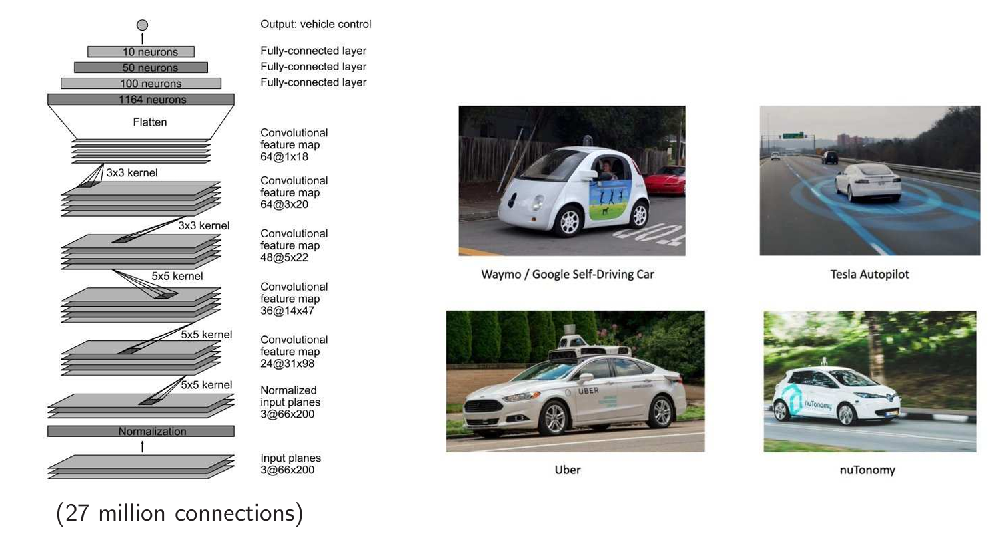

U-Net: Convolutional Networks for Biomedical Image Segmentation

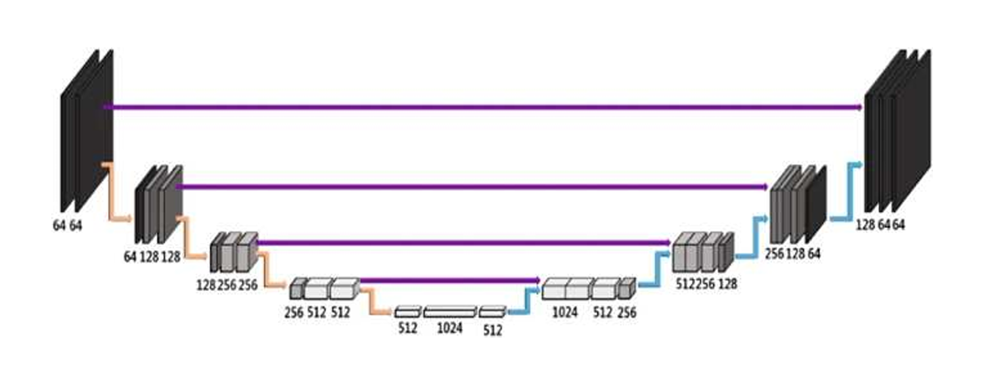

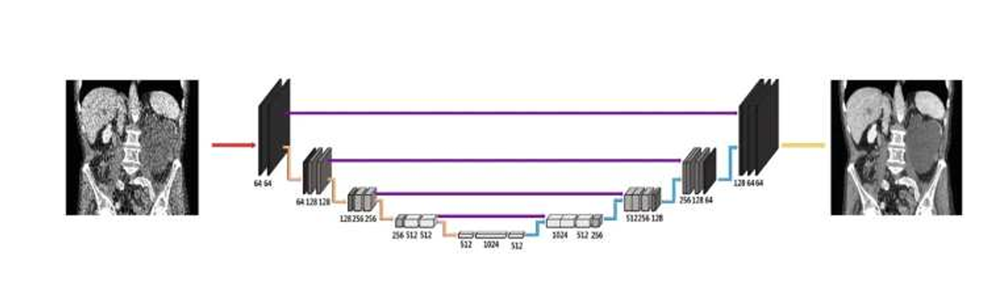

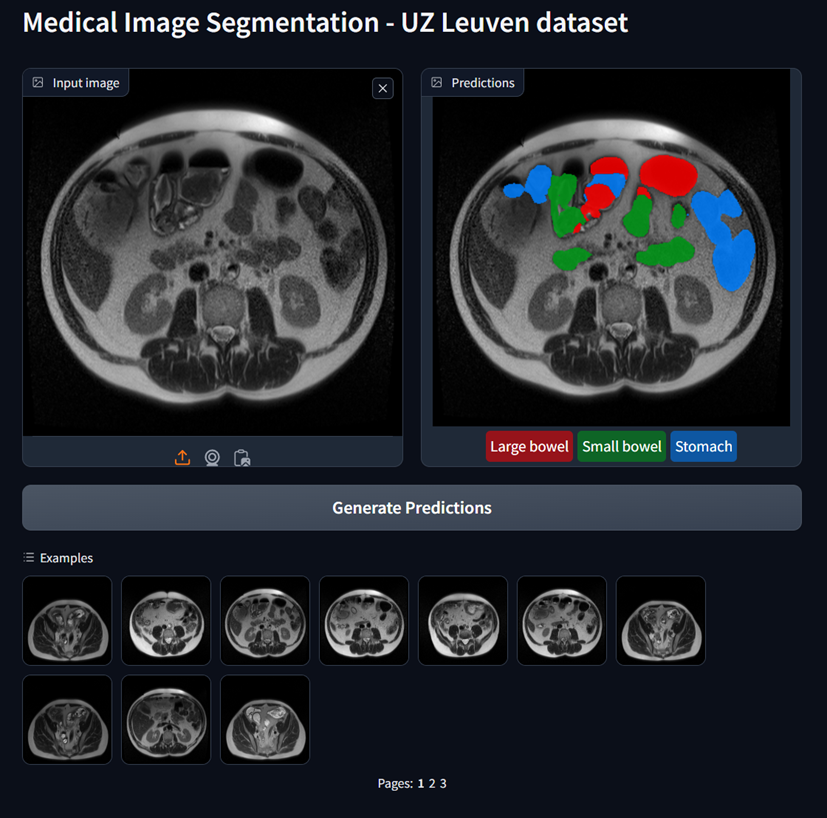

Semantic segmentation [UDL]

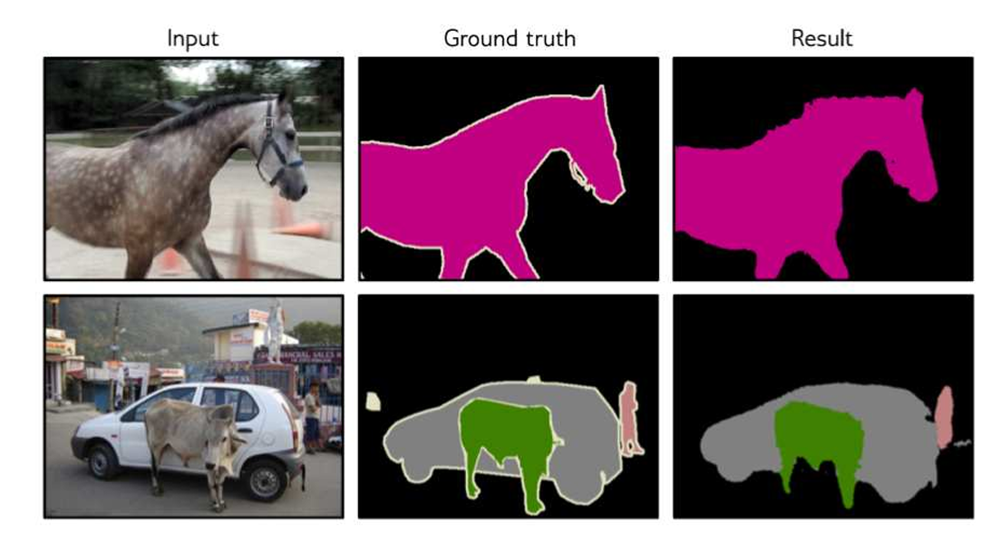

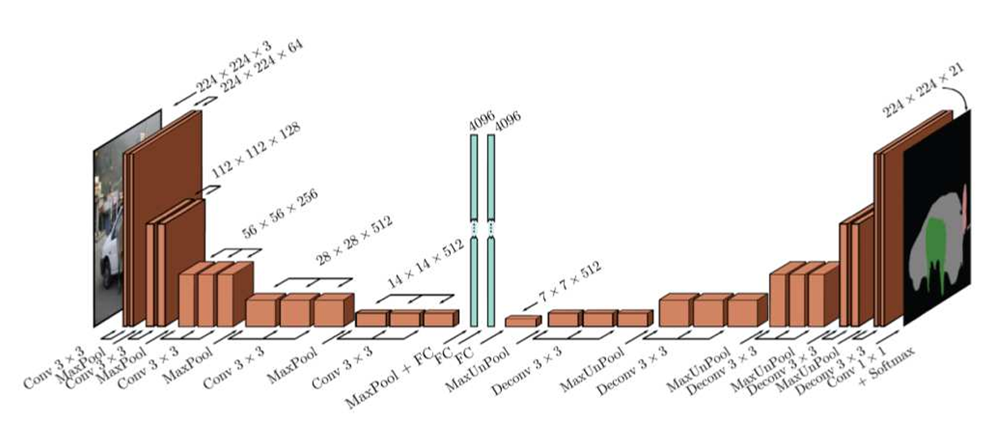

# Modelo avanzado usando convolución

In [ ]:
import torch
import torch.nn as nn
import torchvision.transforms as transforms
from torchvision.datasets import MNIST
from torch.utils.data import DataLoader

class DoubleConv(nn.Module):
    """(convolution => [BN] => ReLU) * 2"""

    def __init__(self, in_channels, out_channels):
        super().__init__()
        self.double_conv = nn.Sequential(
            nn.Conv2d(in_channels, out_channels, kernel_size=3, padding=1),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace=True),
            nn.Conv2d(out_channels, out_channels, kernel_size=3, padding=1),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace=True)
        )

    def forward(self, x):
        return self.double_conv(x)

class UNet(nn.Module):
    def __init__(self):
        super(UNet, self).__init__()
        self.down_conv1 = DoubleConv(1, 64)
        self.down_conv2 = DoubleConv(64, 128)
        self.pool = nn.MaxPool2d(kernel_size=2, stride=2)
        self.upsample = nn.Upsample(scale_factor=2, mode='bilinear', align_corners=True)
        self.up_conv1 = DoubleConv(128, 64)

        self.avgpool = nn.AdaptiveAvgPool2d((1, 1)) # Add global average pooling layer
        self.fc = nn.Linear(64, 10) # Fully connected layer for classification

    def forward(self, x):
        # Encoder
        x1 = self.down_conv1(x)
        x2 = self.pool(x1)
        x3 = self.down_conv2(x2)
        # Decoder
        x = self.upsample(x3)
        x = self.up_conv1(x)
        # Global average pooling and fully connected layer
        x = self.avgpool(x)
        x = torch.flatten(x, 1) # Flatten the features
        x = self.fc(x) # Classification
        return x


In [ ]:
# Training settings (simplified for example)
model = UNet()
criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(model.parameters(), lr=0.001)

# Load MNIST dataset
transform = transforms.Compose([transforms.ToTensor()])
train_dataset = MNIST(root='./data', train=True, download=True, transform=transform)
train_loader = DataLoader(train_dataset, batch_size=64, shuffle=True)

In [ ]:
# Simplified training loop
for epoch in range(1):
    for batch_idx, (data, target) in enumerate(train_loader):
        optimizer.zero_grad()
        output = model(data)
        loss = criterion(output, target)
        loss.backward()
        optimizer.step()

        if batch_idx % 10 == 0:
            print(f'Epoch {epoch}, Batch {batch_idx}, Loss: {loss.item()}')


Epoch 0, Batch 0, Loss: 0.7603299021720886
Epoch 0, Batch 10, Loss: 0.6122781038284302
Epoch 0, Batch 20, Loss: 0.6150088906288147
Epoch 0, Batch 30, Loss: 0.5589423179626465
Epoch 0, Batch 40, Loss: 0.41421979665756226
Epoch 0, Batch 50, Loss: 0.36823949217796326
Epoch 0, Batch 60, Loss: 0.3452048599720001


KeyboardInterrupt: 

In [ ]:
import keras

from keras.models import Sequential
from keras.layers import Dense, Activation, LayerNormalization

model = Sequential([
    Dense(units=16, input_shape=(1,10), activation='relu'),
    LayerNormalization(axis=1),
    Dense(units=10, activation='relu'),
    LayerNormalization(axis=1),
    Dense(units=3, activation='softmax')
])


# Ejemplo de clasificación sin convolución

In [ ]:
import torch
import torch.nn as nn
from torch.utils.data import Dataset, DataLoader
from torch.optim import Adam

# Visualization tools
import torchvision
import torchvision.transforms.v2 as transforms
import torchvision.transforms.functional as F
import matplotlib.pyplot as plt

In [ ]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
torch.cuda.is_available()

False

## El dataset MNIST

En la historia del aprendizaje automático usando redes neuronales, la clasificación de imágenes del [conjunto de datos MNIST](http://yann.lecun.com/exdb/mnist/), una colección de 70.000 imágenes en escala de grises de dígitos escritos a mano del 0 al 9, fue un desarrollo importante. Si bien hoy en día el problema se considera trivial, clasificar imágenes con MNIST se ha convertido en una especie de "Hola mundo" para el aprendizaje profundo.

En PyTorch, podemos usar nuestra GPU en nuestras operaciones configurando el [dispositivo](https://pytorch.org/docs/stable/tensor_attributes.html#torch.device) en `cuda`. La función `torch.cuda.is_available()` confirmará que PyTorch puede reconocer la GPU.

### Descargando los datos

In [ ]:
train_set = torchvision.datasets.MNIST("./data/", train=True, download=True)
valid_set = torchvision.datasets.MNIST("./data/", train=False, download=True)

## Explorando los datos

In [ ]:
x_0, y_0 = train_set[30]

In [ ]:
x_0

In [ ]:
type(x_0)

PIL.Image.Image

Qué número creen que es?

In [ ]:
y_0

3

## Transformando las imágenes

También podemos ver el tamaño de cada dimensión. PyTorch utiliza una convención `C x H x W`, lo que significa que la primera dimensión es el canal de color, la segunda es la altura y la tercera es el anch|o.

Como estas imágenes son en blanco y negro, solo hay 1 canal de color. Las imágenes son cuadradas y miden 28 píxeles de alto y ancho:

In [ ]:
trans = transforms.Compose([transforms.ToTensor()])
x_0_tensor = trans(x_0)

/usr/local/lib/python3.10/dist-packages/torchvision/transforms/v2/_deprecated.py:42: UserWarning: The transform `ToTensor()` is deprecated and will be removed in a future release. Instead, please use `v2.Compose([v2.ToImage(), v2.ToDtype(torch.float32, scale=True)])`.Output is equivalent up to float precision.
  warnings.warn(


In [ ]:
type(x_0)

PIL.Image.Image

In [ ]:
x_0_tensor.shape

torch.Size([1, 28, 28])

In [ ]:
x_0_tensor.dtype

torch.float32

In [ ]:
x_0_tensor.min()

tensor(0.)

In [ ]:
x_0_tensor.max()

tensor(1.)

In [ ]:
x_0_tensor.size()

torch.Size([1, 28, 28])

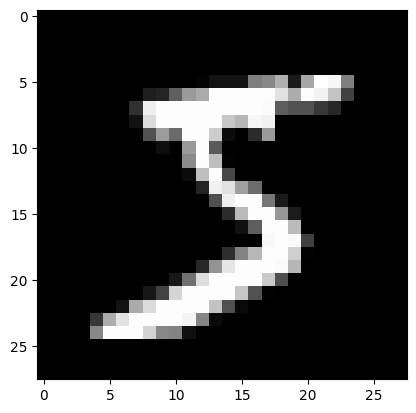

In [ ]:
image = F.to_pil_image(x_0_tensor)
plt.imshow(image, cmap='gray')

## Preparando el entrenamiento

La función [Compose](https://pytorch.org/vision/stable/generated/torchvision.transforms.v2.Compose.html#torchvision.transforms.v2.Compose) combina un secuencia de transformaciones.

In [ ]:
trans = transforms.Compose([transforms.ToTensor()])

In [ ]:
train_set.transform = trans
valid_set.transform = trans

Si nuestro conjunto de datos es un mazo de cartas, un [DataLoader](https://pytorch.org/tutorials/beginner/basics/data_tutorial.html#preparing-your-data-for-training-with-dataloaders) define cómo obtenemos las cartas del mazo para entrenar un modelo de IA.

Podríamos mostrar a nuestros modelos todo el conjunto de datos a la vez. Esto no solo requiere muchos recursos computacionales, sino que [está comprobado](https://arxiv.org/pdf/1804.07612) que usar un lote más pequeño de datos es más eficiente para el entrenamiento de modelos.

Por ejemplo, si nuestro `batch_size` es 32, entrenaremos nuestro modelo barajando el mazo y robando 32 cartas. No necesitamos mezclar para el conjunto de validación ya que el modelo no está aprendiendo, pero aún así usaremos un `batch_size` para evitar errores de memoria.

El tamaño del lote (`batch size`) es algo que decide el desarrollador del modelo y el mejor valor dependerá del problema que se resuelva. Las investigaciones muestran que 32 o 64 es suficiente para muchos problemas de aprendizaje automático y es el valor predeterminado en algunos marcos de aprendizaje automático, por lo que usaremos 32 aquí.

In [ ]:
batch_size = 32

train_loader = DataLoader(train_set, batch_size=batch_size, shuffle=True)
valid_loader = DataLoader(valid_set, batch_size=batch_size)

## Estructura de nuestro modelo

In [ ]:
input_size = 1 * 28 * 28

In [ ]:
n_classes = 10

layers = [
    nn.Flatten(),
    nn.Linear(input_size, 512),  # Entrada
    nn.ReLU(),  # Activación para la entrada
    nn.Linear(512, 512),  # Oculta
    nn.ReLU(),  # Activación para oculta
    nn.Linear(512, n_classes)  # Salida
]
layers

[Flatten(start_dim=1, end_dim=-1),
 Linear(in_features=784, out_features=512, bias=True),
 ReLU(),
 Linear(in_features=512, out_features=512, bias=True),
 ReLU(),
 Linear(in_features=512, out_features=10, bias=True)]

In [ ]:
nn.Sequential(
    nn.Flatten(),
    nn.Linear(input_size, 512),  # Entrada
    nn.ReLU(),  # Activación para la entrada
    nn.Linear(512, 512),  # Oculta
    nn.ReLU(),  # Activación para oculta
    nn.Linear(512, n_classes) # Salida
)

### Compilamos el modelo

In [ ]:
model = nn.Sequential(*layers)
model

Sequential(
  (0): Flatten(start_dim=1, end_dim=-1)
  (1): Linear(in_features=784, out_features=512, bias=True)
  (2): ReLU()
  (3): Linear(in_features=512, out_features=512, bias=True)
  (4): ReLU()
  (5): Linear(in_features=512, out_features=10, bias=True)
)

In [ ]:
model.to(device)

Sequential(
  (0): Flatten(start_dim=1, end_dim=-1)
  (1): Linear(in_features=784, out_features=512, bias=True)
  (2): ReLU()
  (3): Linear(in_features=512, out_features=512, bias=True)
  (4): ReLU()
  (5): Linear(in_features=512, out_features=10, bias=True)
)

## Entrenamiento del modelo

#### Función de pérdida y optimización

Usaremos un tipo de función de pérdida llamada [CrossEntropy](https://pytorch.org/docs/stable/generated/torch.nn.CrossEntropyLoss.html) que está diseñada para calificar si un modelo predijo la categoría correcta de un grupo de categorías.

In [ ]:
loss_function = nn.CrossEntropyLoss()

Recordemos que el optimizador es el algoritmo usado para poder entrenar nuestra red

In [ ]:
optimizer = Adam(model.parameters())

### Calculando la precisión

In [ ]:
train_N = len(train_loader.dataset)
valid_N = len(valid_loader.dataset)

In [ ]:
train_N

60000

A continuación, crearemos una función para calcular la precisión de cada batch. El resultado es una fracción de la precisión total, por lo que podemos sumar la precisión de cada lote para obtener el total.

In [ ]:
def get_batch_accuracy(output, y, N):
    """
    :output: Los valores de prediccion del modelo
    :y: Los valores reales de clase de las imagenes
    :N: El numero de imágenes del dataset
    """
    pred = output.argmax(dim=1, keepdim=True)
    correct = pred.eq(y.view_as(pred)).sum().item()
    return correct / N

### La función de entrenamiento

In [ ]:
def train():
    loss = 0
    accuracy = 0

    model.train()
    for x, y in train_loader:
        x, y = x.to(device), y.to(device)
        output = model(x)
        optimizer.zero_grad()
        batch_loss = loss_function(output, y)
        batch_loss.backward()
        optimizer.step()

        # Update de los valores de la función de pérdida y precisión
        loss += batch_loss.item()
        # Podemos cambiar la métrica objetivo
        accuracy += get_batch_accuracy(output, y, train_N)
    print('Train - Loss: {:.4f} Accuracy: {:.4f}'.format(loss, accuracy))

### La función de validación

In [ ]:
def validate():
    loss = 0
    accuracy = 0

    model.eval()
    with torch.no_grad():
        for x, y in valid_loader:
            x, y = x.to(device), y.to(device)
            output = model(x)

            loss += loss_function(output, y).item()
            accuracy += get_batch_accuracy(output, y, valid_N)
    print('Valid - Loss: {:.4f} Accuracy: {:.4f}'.format(loss, accuracy))

### El ciclo de entrenamiento

In [ ]:
epochs = 5

for epoch in range(epochs):
    print('Epoch: {}'.format(epoch))
    train()
    validate()

Epoch: 0
Train - Loss: 212.2449 Accuracy: 0.9324
Valid - Loss: 31.4441 Accuracy: 0.9685
Epoch: 1
Train - Loss: 79.0900 Accuracy: 0.9742
Valid - Loss: 30.4114 Accuracy: 0.9689
Epoch: 2
Train - Loss: 52.8360 Accuracy: 0.9818
Valid - Loss: 22.2037 Accuracy: 0.9794
Epoch: 3
Train - Loss: 38.6887 Accuracy: 0.9861
Valid - Loss: 30.4153 Accuracy: 0.9709
Epoch: 4
Train - Loss: 30.0069 Accuracy: 0.9892
Valid - Loss: 21.9177 Accuracy: 0.9795


## Predicción

In [ ]:
prediction = model(x_0_tensor)
prediction

tensor([[ -8.0458,  -1.5760,   1.5541,   8.1991,  -4.9957,  -9.4211,  -9.2973,
           0.1511,  -2.0657, -10.7547]], grad_fn=<AddmmBackward0>)

In [ ]:
prediction.argmax(dim=1, keepdim=True)

tensor([[3]])

In [ ]:
y_0

3

In [ ]:
F.to_pil_image(x_0_tensor)

# Limpiando la memoria

In [ ]:
import IPython
app = IPython.Application.instance()
app.kernel.do_shutdown(True)

{'status': 'ok', 'restart': True}